In [2]:
import glob
import pandas as pd
from pathlib import Path
from PIL import Image

In [3]:
from tqdm import tqdm
import cv2

### API

In [4]:
from color_clothes_nodisplay import cloth_color

In [5]:
def get_list2dict(k_list, v_list):
    d = {}
    for item in zip(k_list, v_list):
        d[item[0]] = item[1]
    return d

### Data Information

#### csv data

In [21]:
!ls /nas/lichangjian/color_cloth_20220706/

color_clothes.py       githubSeg1.py  img_exists_file.txt  results
color_exists_file.txt  img_color.csv  merge_to_csv.ipynb


In [6]:
%%time
# root_color = Path('/nas/chenyi/workspace/myPyModule/img_color.csv')
df = pd.read_csv('./data/img_color_cy.csv')
# df.to_csv('./data/img_color_cy.csv', index=False)

CPU times: user 3.56 s, sys: 358 ms, total: 3.92 s
Wall time: 4.19 s


In [7]:
df.head(1)

,img_path,color_path,color_len,stem,org_sp
0,/nas/liwenbo/xtc_80w_seg/17/225/000000c3-920d-...,/nas/lichangjian/color_cloth_20220706/results/...,1,000000c3-920d-43ea-8ef7-35090987f963-839405_1,/nas/web/xiaotangcai/retrieval_data_clean_1/17...


In [8]:
df_len1 = pd.read_csv('./data/len1_df.csv')

##### Origin Image 

In [6]:
root_org = Path('/nas/web/xiaotangcai/retrieval_data_clean_1')

In [8]:
# !tree -d -L 3 $root_org/'0/'

In [ ]:
%%time
# org_list = glob.glob(str(root_org /'*/*/*'))
# org_df = pd.DataFrame()
# org_df['org_sp'] = org_list

In [14]:
org_df = pd.read_csv('./data/org_img_df.csv')
# org_df.to_csv('./data/org_img_df.csv', index=False)

In [15]:
org_df['stem'] = org_df['org_sp'].apply(lambda x: Path(x).stem)

In [16]:
org_df.head(1).values

array([['/nas/web/xiaotangcai/retrieval_data_clean_1/0/0/9c978dcc-c183-4ad6-8b39-84e2a5e35859-508466_0.jpg',
        '9c978dcc-c183-4ad6-8b39-84e2a5e35859-508466_0']], dtype=object)

In [20]:
sampel_df = org_df[org_df['stem']=='000000c3-920d-43ea-8ef7-35090987f963-839405_1']
p = sampel_df.iloc[0, 0]
sample_img = cv2.imread(p)

##### 数据处理

In [8]:
%%time
df['stem'] = df['img_path'].apply(lambda x: Path(x).stem)

CPU times: user 8.39 s, sys: 80.4 ms, total: 8.47 s
Wall time: 8.82 s


In [70]:
# %%time
# org_df['stem'] = org_df['img_path'].apply(lambda x: Path(x).stem)

In [71]:
stem2img = get_list2dict(org_df['stem'].values, org_df['org_sp'].values)

In [72]:
%%time
df['org_sp'] = df['stem'].map(stem2img)

CPU times: user 531 ms, sys: 0 ns, total: 531 ms
Wall time: 531 ms


#### parse json

In [25]:
def load_json(jp):
    with open(jp, 'r') as f:
        j = json.load(f)
    return j

In [135]:
import json
# jp = df.iloc[100, 1]
jp = '/nas/lichangjian/color_cloth_20220706/results/0003df41-503c-492f-afbf-5dd3db0b1b9e-524099_1.json'
jp = sample_df['color_path'].values[0]
with open(jp, 'r') as f:
    j = json.load(f)

In [142]:
# %%time
# img = cv2.imread(src_img, cv2.IMREAD_UNCHANGED)
# src_img = sample_df['img_path'].values[0]
# cloth_color(src_img)

In [131]:
# stem2color_info = {}
# for p in tqdm(df['color_path'].values):
#     stem = Path(p).stem
#     stem2color_info[stem] = load_json(p)
#     # break

In [144]:
# import pickle
# with open('./data/stem2color_info.pickle', 'wb') as f:
#     pickle.dump(stem2color_info, f)
# with open('./data/stem2color_info.pickle', 'rb') as f:
#     stem2color_info = pickle.load(f)

In [29]:
len_list = []
for p in tqdm(df['color_path'].values):
    len_list.append(len(load_json(p)))

100%|█████████████████████████████████████████████| 877633/877633 [06:28<00:00, 2261.00it/s]


In [30]:
df['color_len'] = len_list

In [157]:
# df.describe()

#### len

In [158]:
df_len1 = df[df['color_len']==1].copy(deep=True)

In [159]:
ratio_list = []
for p in tqdm(df_len1['color_path'].values):
    d = load_json(p)
    ratio_list.append(d['0']['r'])

100%|█████████████████████████████████████████████| 205597/205597 [01:29<00:00, 2306.22it/s]


In [160]:
df_len1['ratio'] = ratio_list

In [161]:
color_rgb_list = []
for stem in tqdm(df_len1['stem'].values):
    c = stem2color_info[stem]
    color_rgb_list.append(c['0']['color_RGB'])

100%|███████████████████████████████████████████| 205597/205597 [00:00<00:00, 737204.04it/s]


In [162]:
color_df = pd.DataFrame(color_rgb_list)
df_len1['r'] = color_df.iloc[:, 0].values
df_len1['g'] = color_df.iloc[:, 1].values
df_len1['b'] = color_df.iloc[:, 2].values

In [163]:
df_len1.to_csv('./data/len1_df.csv', index=False)

In [256]:
df_len1.describe()

,color_len,ratio,r,g,b
count,205597.0,205597.0,205597.000000,205597.000000,205597.000000
mean,1.0,1.0,105.766655,104.560986,106.502682
std,0.0,0.0,78.250045,74.354619,73.361785
min,1.0,1.0,0.000000,0.000000,0.000000
25%,1.0,1.0,28.000000,32.000000,37.000000
50%,1.0,1.0,97.000000,96.000000,96.000000
75%,1.0,1.0,181.000000,173.000000,173.000000
max,1.0,1.0,255.000000,255.000000,255.000000


##### 指定颜色df

In [215]:
step = 10
thres_r0 = thres_r1 - step
thres_r1 = 256
thres_g0 = 0
thres_g1 = thres_g0 + step
thres_b0 = 0
thres_b1 = thres_b0 + step

df_color = df_len1[(df_len1['r']>thres_r0) & (df_len1['r']<thres_r1) &
                  (df_len1['g']>thres_g0) & (df_len1['g']<thres_g1) &
                  (df_len1['b']>thres_b0) & (df_len1['b']<thres_b1)]
len(df_color)

0

##### 颜色统计

<AxesSubplot:xlabel='r'>

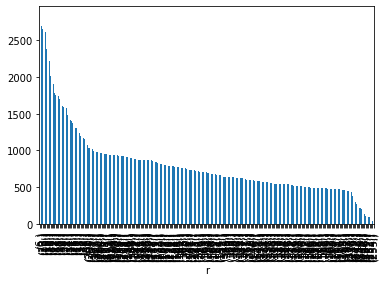

In [30]:
df_len1.value_counts('r').plot.bar()

<AxesSubplot:xlabel='g'>

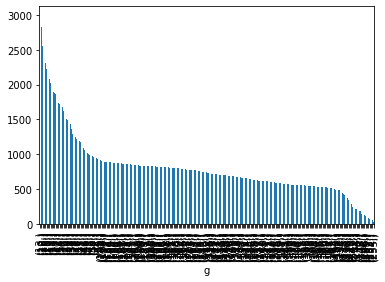

In [31]:
df_len1.value_counts('g').plot.bar()

<AxesSubplot:xlabel='b'>

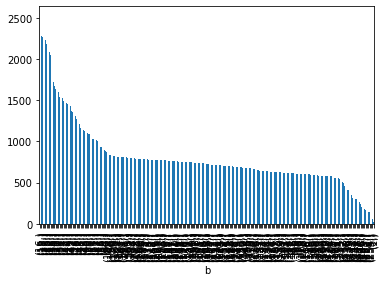

In [32]:
df_len1.value_counts('b').plot.bar()

In [45]:
# df_len1.value_counts('distance').plot.bar()

##### 颜色搜索

In [33]:
import numpy as np

In [34]:
import random 

In [67]:
# r_rand = random.randint(0,200)
# g_rand = random.randint(0,200)
# b_rand = random.randint(0,200)

In [122]:
# sample1 = df_len1.sample(1)
r_rand, g_rand, b_rand = df_len1.loc[random.randint(0, len(df_len1)), ['r', 'g', 'b']].values.tolist()
r_rand, g_rand, b_rand

(153, 212, 255)

In [123]:
df_len1['distance'] = np.sqrt((df_len1['r'].values - r_rand)**2 + \
                        (df_len1['g'].values - g_rand)**2 + \
                        (df_len1['b'].values - b_rand)**2)

In [124]:
dis_df = df_len1.sort_values('distance', ascending=True)[:500]

#### 单例查询

In [177]:
stem = '2dc5b04c-922e-4244-bb0d-fca7c3842c3d-293459_6'
sample_df = df[df['stem']==stem]
sample_df

,img_path,color_path,color_len,stem,org_sp
170739,/nas/liwenbo/xtc_80w_seg/10/65/2dc5b04c-922e-4244-bb0d-fca7c3842c3d-293459_6.png,/nas/lichangjian/color_cloth_20220706/results/2dc5b04c-922e-4244-bb0d-fca7c3842c3d-293459_6.json,1,2dc5b04c-922e-4244-bb0d-fca7c3842c3d-293459_6,/nas/web/xiaotangcai/retrieval_data_clean_1/10/65/2dc5b04c-922e-4244-bb0d-fca7c3842c3d-293459_6.jpg


In [178]:
stem2color_info[stem]

{'0': {'color_RGB': [63, 64, 65], 'r': 1.0}}

In [180]:
# %%time
img_path = sample_df['img_path'].values[0]
cloth_color(img_path)

(497, 243, 4)
(497, 243, 3)
0 [ 69.66968557 129.         127.63553518]
1.0
total time: 0.26593995094299316


### Image show

In [39]:
import matplotlib.pylab as plt
# plt.imshow(img_png)

In [40]:
import cv2
# img_png = cv2.imread(imgp)

#### 3D颜色展示

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [28]:
df_len1_100 = df_len1.loc[:100, ['r', 'g', 'b']]
len(df_len1_100)

101

100%|████████████████████████████████████████████████████| 101/101 [00:00<00:00, 642.86it/s]

CPU times: user 171 ms, sys: 4.03 ms, total: 175 ms
Wall time: 174 ms


Text(0.5, 0, 'Z Label')

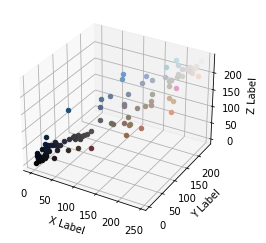

In [29]:
%%time
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
for rgb in tqdm(df_len1_100.values):
    xs = rgb[0]
    ys = rgb[1]
    zs = rgb[2]
    ax.scatter(xs, ys, zs, '.', color=rgb/256)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

In [27]:
%%time
fig.savefig('data_show.jpg', dpi=800)

#### 单例显示

In [50]:
stem = '0005abd8-0a3d-4c48-9fab-094d660f2826-157296_1'
sample_df = df[df['stem']==stem]
segp = Path(sample_df.iloc[0, 0])
orgp = Path(sample_df.iloc[0, 4])

In [51]:
sample_img = cv2.imread(str(p))

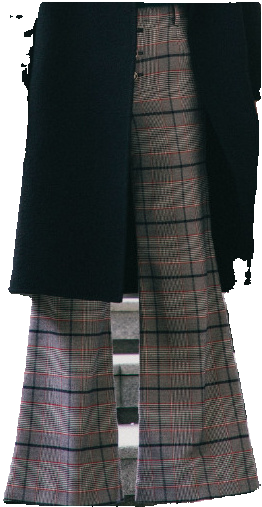

In [52]:
Image.open(segp)

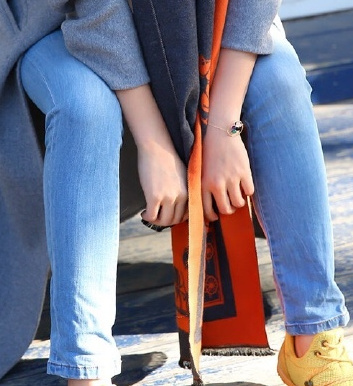

In [44]:
Image.open(orgp)

#### HTML Display

In [49]:
import sys
sys.path.append('../utils/')

In [50]:
from display.html import *

/home/chenyi/workspace/myPyModule99/retrieval_color/../utils/display/html.py:8: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


In [52]:
# stem = '838f39c6-60a5-48fe-b818-fc3afc56f6ff-711417_0'
# stem2color_info[stem]

In [282]:
step = 30
thres_r0 = 250
thres_r1 = 256
thres_g0 = 250
thres_g1 = 256
thres_b0 = 250
thres_b1 = 256

df_color = df_len1[(df_len1['r']>thres_r0) & (df_len1['r']<thres_r1) &
                   (df_len1['g']>thres_g0) & (df_len1['g']<thres_g1) &
                   (df_len1['b']>thres_b0) & (df_len1['b']<thres_b1)]
len(df_color)

147

In [47]:
# dis_df = df_len1[200:300]
# dis_df = df_color[:50]

In [125]:
dis_df['image'] = dis_df['org_sp'].map(lambda x: get_thumbnail(x, size=500))

In [126]:
# h = HTML(dis_df[['image', 'stem', 'ratio']].to_html(formatters={'image': image_formatter}, escape=False))

In [127]:
h = HTML(dis_df[['image', 'distance','stem', 'ratio']].to_html(formatters={'image': image_formatter}, escape=False))

In [130]:
with open('color_cls1_rand_sample.html', 'w') as f:
    f.write(h.data)

,image,distance,stem,ratio
33614,,0.000000,26ddc368-ebf2-4eef-a548-371be90e9eea-129538_0,1.0
73788,,3.316625,570c74c1-39ab-41c4-86f0-8a623b4cab83-204580_2,1.0
44370,,6.480741,33a546e2-f906-4e2c-b791-de442833970e-506707_1,1.0
27139,,7.141428,1f3c926d-afe7-4349-b9b8-693500469732-358234_2,1.0
179674,,9.899495,de1cee9c-5ccc-49b8-9290-67792022a64f-311446_1,1.0
159319,,10.392305,c3f6d209-99af-43df-a229-94c6f98b6b69-581970_1,1.0
32403,,12.247449,258309d9-af4e-4e12-82d8-da1de3808b95-534639_0,1.0
165812,,12.247449,cc6fae61-aa55-11ec-971c-5cfb3aa6f5e6_0,1.0
197923,,12.328828,f5ae4501-0202-4c28-afc0-4afab26dac9b-306346_1,1.0
24043,,12.884099,1b6c4015-9950-4a11-a95a-6c08193cf232-759193_0,1.0

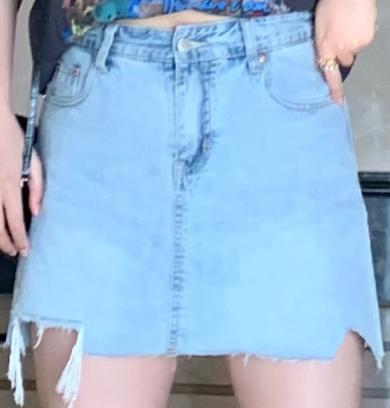
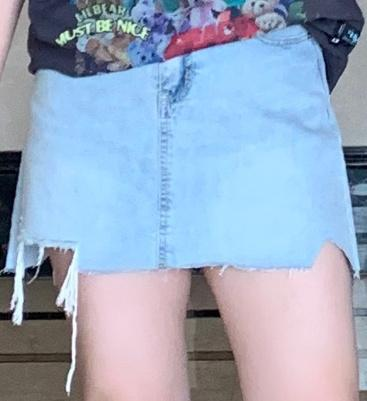
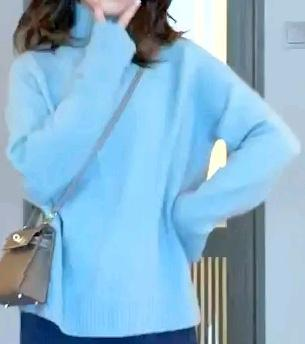
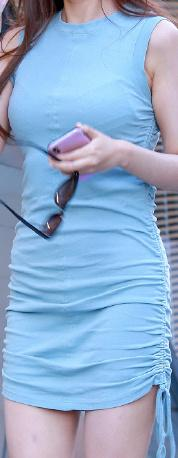
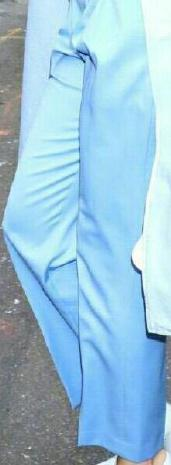
...
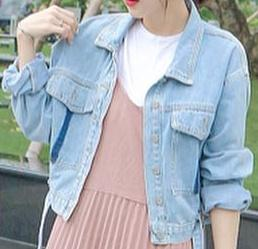
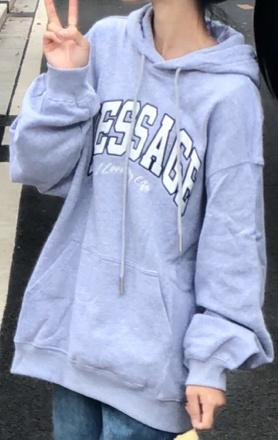
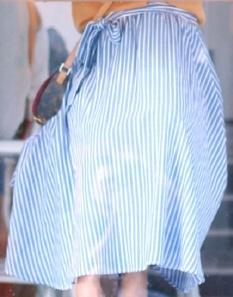
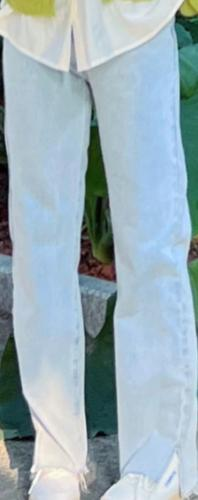
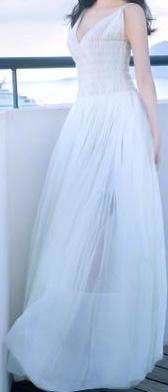

In [129]:
h